In [12]:
import sys
sys.path.append('..')

import numpy as np
from tqdm.auto import tqdm, trange

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import os

from model import *
from utils import *
import pandas as pd
# import seaborn as sns

import matplotlib.pyplot as plt
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [13]:
def load_model(model, exp_name, ckpt=0, final=False, best=False, file_name=None):
    if file_name:
        fn = file_name
    elif best:
        fn = 'best-model.pth'
    elif final:
        fn = 'final-model.pth'
    else:
        fn = f'checkpoint-{ckpt}.pth'
    model_path = f'/mnt/lustre/sihaozhe/DeRec/exp/{exp_name}/model/{fn}'
    model_dict = torch.load(model_path)
    state_dict = model_dict['model']
    model.load_state_dict(state_dict)
    return model_dict['iter']

In [14]:
def dpt_post_op(dpt, post_op, near=0.1, far=10.):
    if post_op == 'clip':
        dpt = torch.clip(dpt, 0, 1).detach().cpu()
    elif post_op == 'norm':
        dpt_local_min = torch.min(dpt.view(1, -1), dim=1)[0].view(1, 1, 1)
        dpt_local_max = torch.max(dpt.view(1, -1), dim=1)[0].view(1, 1, 1)
        norm_dpt_ = dpt / (dpt_local_max + 1e-8)
        # norm_dpt_ = (dpt - dpt_local_min)/(dpt_local_max - dpt_local_min + 1e-8)
        norm_dpt = norm_dpt_ * (far - near) + near
        dpt = norm_dpt.detach().cpu()
    return dpt

In [15]:
data_path = "/mnt/petrelfs/sihaozhe/my_fs_6"
device = 2
BS = 1
use_cuda = True

In [16]:
# trans = True
# if trans:
#     fd = [2, 3, 4.5, 5, 7]
# else:
#     fd = [1, 1.5, 2.5, 4, 6]
fd = [0.3, 0.45, 0.75, 1.2, 1.8]

In [17]:
dataset_config = {
        'root_dir': data_path,
        'shuffle': False,
        'img_num':  5, 
        'visible_img': 5,
        'focus_dist': fd,
        'recon_all': True,
        'RGBFD': True,
        'DPT': True,
        'AIF': True,
        'near': 0.001,
        'far':3.,
        'scale':1,
    }

In [18]:
torch.cuda.set_device(device)

In [19]:
camera = ThinLenCamera(fnumber=1.2, focal_length=2.9*1e-3, pixel_size=5.6e-6)
render = GaussPSF(7)
render.cuda()
model = DAIFNet(4, 4)

In [20]:
train_dl, _, test_dl = load_data(dataset_config, "DefocusNet", BS)

5 out of 5 images per sample are visible for input
Total number of training sample: 500
Total number of testing sample: 100
Total number of testing sample: 500


In [21]:
best=True
post_op = 'norm'
model_name = 'DefocusNet_my_data_nearer'
# upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)

/tmp/ipykernel_56426/3925206291.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(10, 6))


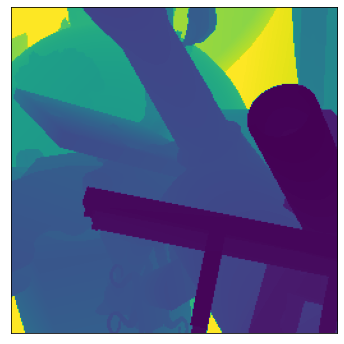

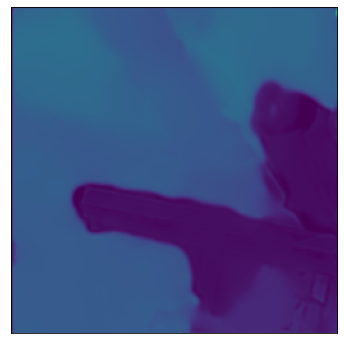

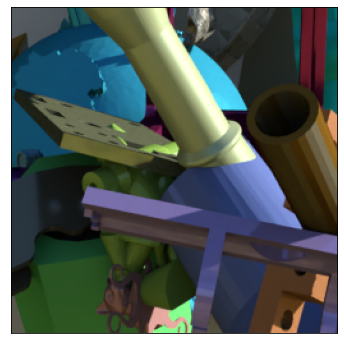

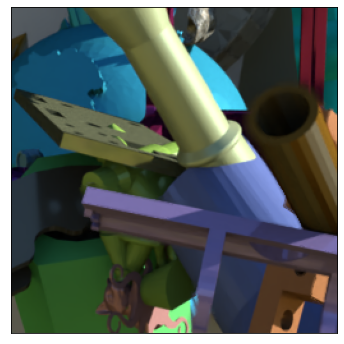

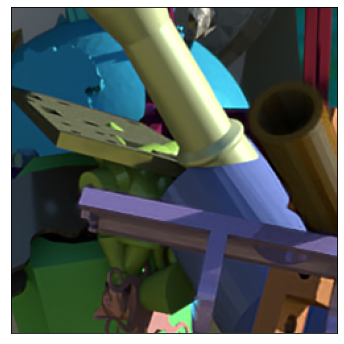

...

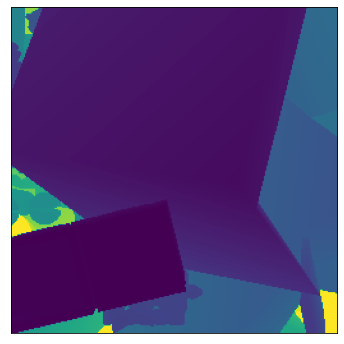

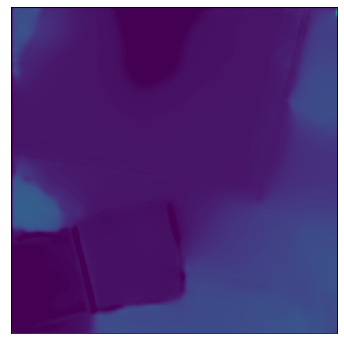

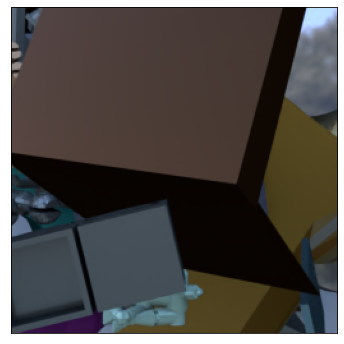

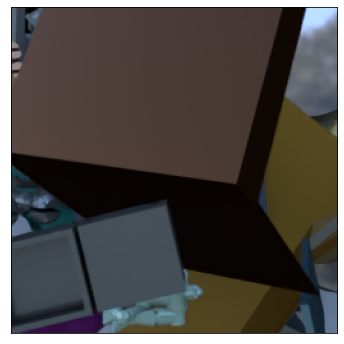

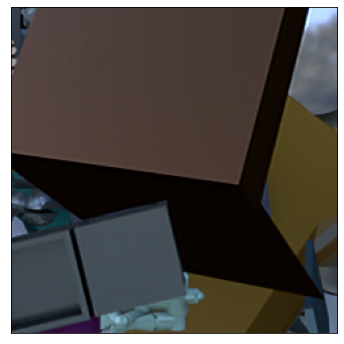

In [22]:
exp_name = f'{model_name}'
n_iter = load_model(model, exp_name, best=best)
model = model.cuda()
for i in range(20):
    sample = test_dl.dataset[i]
    FS, C, H, W = sample['output'].shape
    with torch.no_grad():
        raw_aif_dpt = model(sample['rgb_fd'].unsqueeze(0).cuda())
        raw_aif = raw_aif_dpt[:, :-1]
        raw_dpt = raw_aif_dpt[:, -1]
    pred_dpt = dpt_post_op(raw_dpt, post_op, near=0.001, far=3)
    fd_dpt = pred_dpt.expand(FS, H, W)
    # pred_dpt = upsample(pred_dpt.unsqueeze(0)).squeeze(0)
    pred_aif = torch.clip(raw_aif, 0, 1)
    dpt_gt = sample['dpt'].numpy()[0]
    aif_gt = sample['aif'].numpy().transpose(1, 2, 0)
    
    focal_stack = sample['rgb_fd'].numpy()[:, :-1].transpose(0, 2, 3, 1)
    fds = sample['output_fd'].view(-1, 1, 1).expand_as(fd_dpt)
    defocus = camera.getCoC(fd_dpt, fds)
    
    plt.figure(figsize=(10, 6))
    plt.imshow(dpt_gt, cmap='viridis')
    plt.xticks([])
    plt.yticks([])
    plt.savefig(f'savefig/my_data_gt_dpt{i}.png')
    
    plt.figure(figsize=(10, 6))
    plt.imshow(pred_dpt[0].cpu().numpy(), cmap='viridis', vmin=np.min(dpt_gt), vmax=np.max(dpt_gt))
    plt.xticks([])
    plt.yticks([])
    plt.savefig(f'savefig/my_data_pred_dpt{i}.png')
    
    plt.figure(figsize=(10, 6))
    plt.imshow(aif_gt)
    plt.xticks([])
    plt.yticks([])
    plt.savefig(f'savefig/my_data_gt_aif{i}.png')
    
    FS, C, H, W = sample['output'].shape
    inp_fs = sample['rgb_fd'][:, :-1]
    clear_idx = torch.argmin(defocus.view(FS, 1, H, W).expand(FS, C, H, W), dim=0, keepdim=True)
    coarse_aif = torch.gather(inp_fs, 0, clear_idx)
    
    plt.figure(figsize=(10, 6))
    plt.imshow(coarse_aif[0].cpu().numpy().transpose(1, 2, 0))
    plt.xticks([])
    plt.yticks([])
    plt.savefig(f'savefig/my_data_coarse_aif{i}.png') 
    
    plt.figure(figsize=(10, 6))
    plt.imshow(pred_aif[0].cpu().numpy().transpose(1, 2, 0)[4:-4, 4:-4])
    plt.xticks([])
    plt.yticks([])
    plt.savefig(f'savefig/my_data_pred_aif{i}.png')

In [47]:
idx = 9
sample = test_dl.dataset[idx]

In [48]:
exp_name = f'{model_name}'
n_iter = load_model(model, exp_name, best=best)
model = model.cuda()
FS, C, H, W = sample['output'].shape
with torch.no_grad():
    raw_aif_dpt = model(sample['rgb_fd'].unsqueeze(0).cuda())
    raw_aif = raw_aif_dpt[:, :-1]
    raw_dpt = raw_aif_dpt[:, -1]
pred_dpt = dpt_post_op(raw_dpt, post_op, near=0.001, far=3)
fd_dpt = pred_dpt.expand(FS, H, W)
# pred_dpt = upsample(pred_dpt.unsqueeze(0)).squeeze(0)
pred_aif = torch.clip(raw_aif, 0, 1)
dpt_gt = sample['dpt'].numpy()[0]
aif_gt = sample['aif'].numpy().transpose(1, 2, 0)

In [49]:
focal_stack = sample['rgb_fd'].numpy()[:, :-1].transpose(0, 2, 3, 1)
fds = sample['output_fd'].view(-1, 1, 1).expand_as(fd_dpt)
defocus = camera.getCoC(fd_dpt, fds)

In [50]:
# fig = plt.figure(figsize=(20, 6))
# fs_list = [focal_stack, defocus]
# for i in range(2):
#     for j in range(5):
#         # plt.subplot(2, 5, i * 5 + j + 1)
#         plt.figure(figsize=(10, 6))
#         if i == 0:
#             plt.imshow(fs_list[i][j])
#         else:
#             plt.imshow(fs_list[i][j], cmap='viridis', vmin=0, vmax=8)
#         plt.xticks([])
#         plt.yticks([])
        # plt.colorbar()
        # plt.savefig(f'paper_img/{i}-fd{fd[j]}.png')

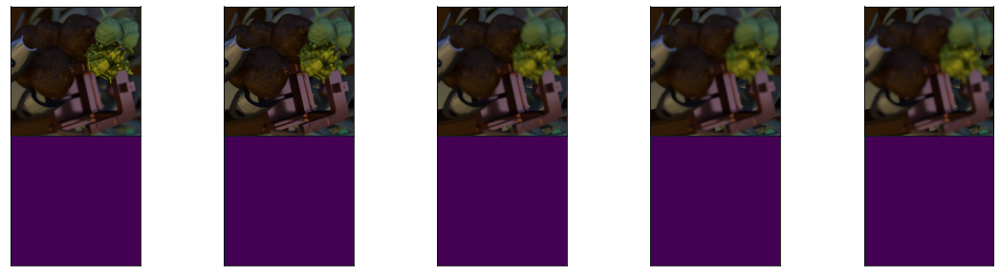

In [51]:
fig = plt.figure(figsize=(20, 5))
gs = fig.add_gridspec(2, 5, hspace=0, wspace=0)
axs = gs.subplots(sharex='col', sharey='row')

fs_list = [focal_stack, defocus]
for i in range(2):
    for j in range(5):
        if i == 0:
            axs[i, j].imshow(fs_list[i][j])
        else:
            axs[i, j].imshow(fs_list[i][j])
        axs[i, j].set_xticks([])
        axs[i, j].set_yticks([])
        
# for ax in axs.flat:
#     ax.label_outer()
# fig.tight_layout()

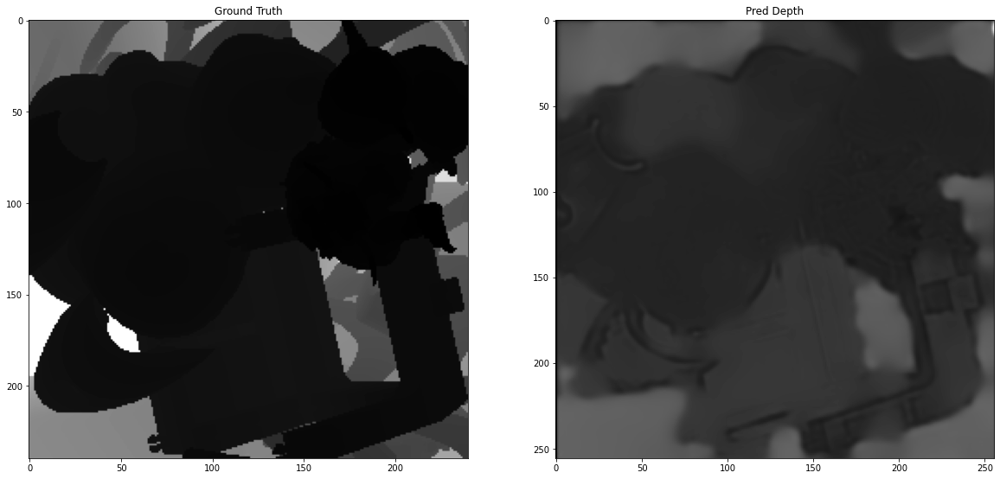

In [52]:
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.title('Ground Truth')
plt.imshow(dpt_gt[8:-8, 8:-8], cmap='Greys_r')
plt.subplot(1, 2, 2)
plt.title('Pred Depth')
plt.imshow(pred_dpt[0].cpu().numpy(), cmap='Greys_r')

In [53]:
dpt_gt.shape

(256, 256)

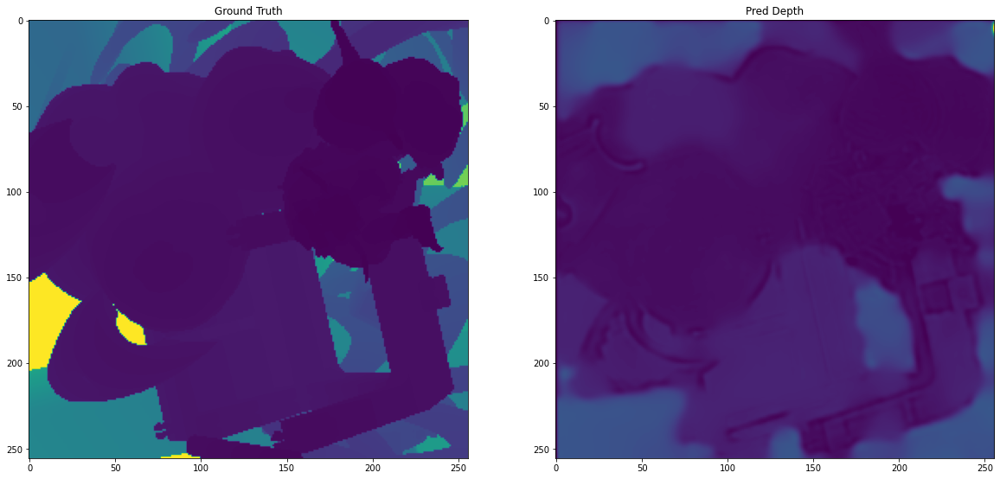

In [60]:
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.title('Ground Truth')
plt.imshow(dpt_gt, cmap='viridis')
# plt.colorbar()
# plt.imshow(dpt_gt, cmap='viridis', vmin=0, vmax=3)
plt.subplot(1, 2, 2)
plt.title('Pred Depth')
plt.imshow(pred_dpt[0].cpu().numpy(), cmap='viridis')
plt.imshow(pred_dpt[0].cpu().numpy(), cmap='viridis', vmin=np.min(dpt_gt), vmax=np.max(dpt_gt))
# plt.colorbar()

([], [])

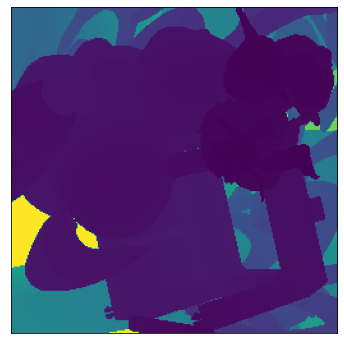

In [65]:
plt.figure(figsize=(10, 6))
plt.imshow(dpt_gt, cmap='viridis')
plt.xticks([])
plt.yticks([])
# plt.savefig('paper_img/gt_dpt.png')

([], [])

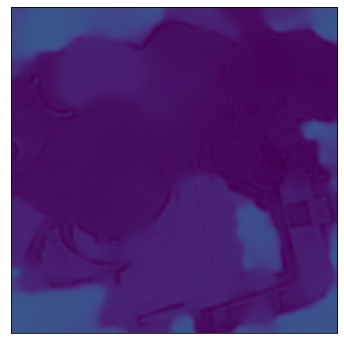

In [66]:
plt.figure(figsize=(10, 6))
plt.imshow(pred_dpt[0].cpu().numpy()[4:-4, 4:-4], cmap='viridis', vmin=np.min(dpt_gt), vmax=np.max(dpt_gt))
plt.xticks([])
plt.yticks([])
# plt.savefig('paper_img/pred_dpt.png')

([], [])

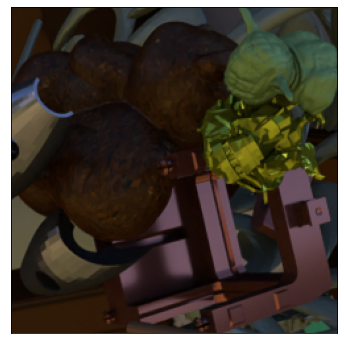

In [67]:
plt.figure(figsize=(10, 6))
plt.imshow(aif_gt[4:-4, 4:-4])
plt.xticks([])
plt.yticks([])
# plt.savefig('paper_img/gt_aif.png')

([], [])

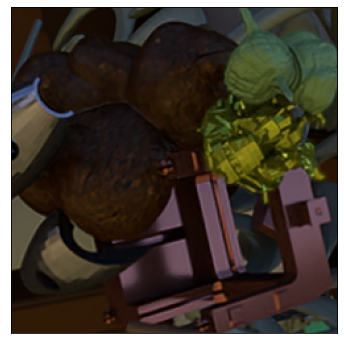

In [69]:
plt.figure(figsize=(10, 6))
plt.imshow(pred_aif[0].cpu().numpy().transpose(1, 2, 0)[4:-4, 4:-4])
plt.xticks([])
plt.yticks([])
# plt.savefig('paper_img/pred_aif.png')

In [70]:
FS, C, H, W = sample['output'].shape
inp_fs = sample['rgb_fd'][[0, 1, 3, 4], :-1]
clear_idx = torch.argmin(defocus[[0, 1, 3, 4]].view(4, 1, H, W).expand(4, C, H, W), dim=0, keepdim=True)
coarse_aif = torch.gather(inp_fs, 0, clear_idx)

([], [])

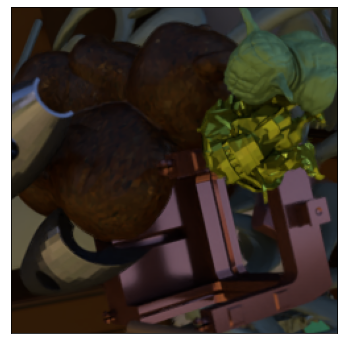

In [71]:
plt.figure(figsize=(10, 6))
plt.imshow(coarse_aif[0].cpu().numpy().transpose(1, 2, 0)[4:-4, 4:-4])
plt.xticks([])
plt.yticks([])
# plt.savefig('paper_img/coarse_aif.png') 

In [23]:
render = GaussPSF(7)

In [24]:
fs_aif = pred_aif.expand(5, C, H, W).contiguous().view(5, C, H, W)

In [25]:
recon = render(fs_aif.cuda(), defocus.cuda()).detach().cpu().numpy().transpose(0, 2, 3, 1) # FS C H W

In [26]:
recon.shape

(5, 240, 320, 3)

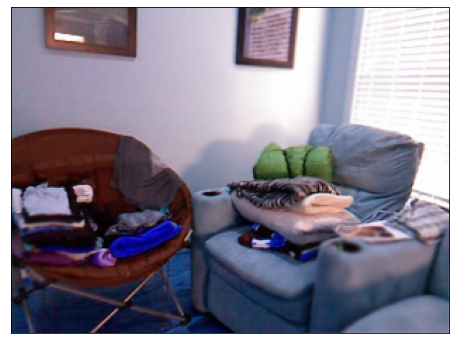

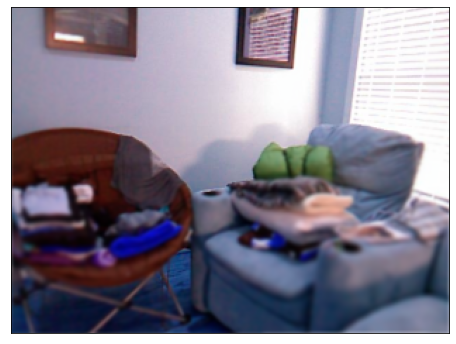

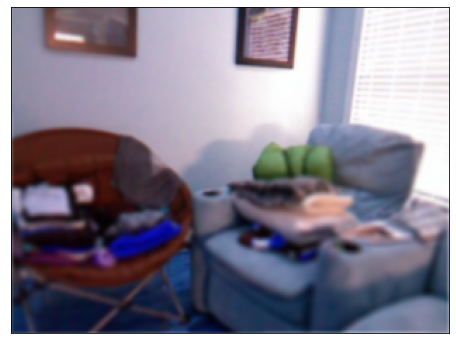

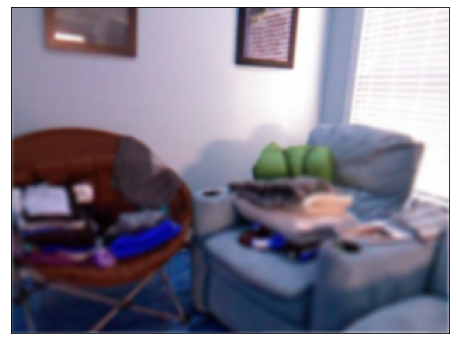

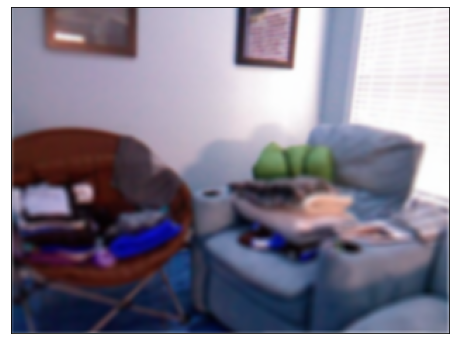

In [27]:
# fig =  plt.figure(figsize=(20, 6))
for j, img in enumerate(recon):
    # plt.subplot(2, 5, i * 5 + j + 1)
    plt.figure(figsize=(10, 6))
    plt.imshow(img[4:-4, 4:-4])
    plt.xticks([])
    plt.yticks([])
    plt.savefig(f'paper_img/2-fd{fd[j]}.png')

In [80]:
df_fs = pd.read_csv('FS_exp.csv')
df_fs

,Setting,n_img,AbsRel,RMSE,delta1,delta2,delta3,SF,MG
0,NYU100_FS3,1,0.656655,1.204578,0.346412,0.620115,0.811164,0.112094,0.030981
1,NYU100_FS5,1,0.689094,1.246112,0.333672,0.605840,0.799298,0.117777,0.034379
2,NYU100_FS7,1,0.505904,1.091075,0.384863,0.674428,0.847618,0.119203,0.033645
3,NYU100_FS3,2,0.292052,0.667339,0.770194,0.893874,0.950561,0.125645,0.035394
4,NYU100_FS5,2,0.329784,0.737045,0.716860,0.876345,0.943463,0.128960,0.037980
5,NYU100_FS7,2,0.327419,0.780798,0.690809,0.856122,0.935941,0.127573,0.037149
6,NYU100_FS3,3,0.269267,0.495430,0.869207,0.940392,0.959624,0.125224,0.125224
7,NYU100_FS5,3,0.283548,0.501611,0.858146,0.936618,0.957143,0.127359,0.036241
8,NYU100_FS7,3,0.309503,0.536501,0.849472,0.937904,0.958860,0.125450,0.035716
9,NYU100_FS3,4,0.285706,0.556823,0.771823,0.972551,0.986055,0.126244,0.035377


In [81]:
import matplotlib.lines as mlines


In [82]:
df_fs = df_fs.loc[df_fs.n_img!=1]


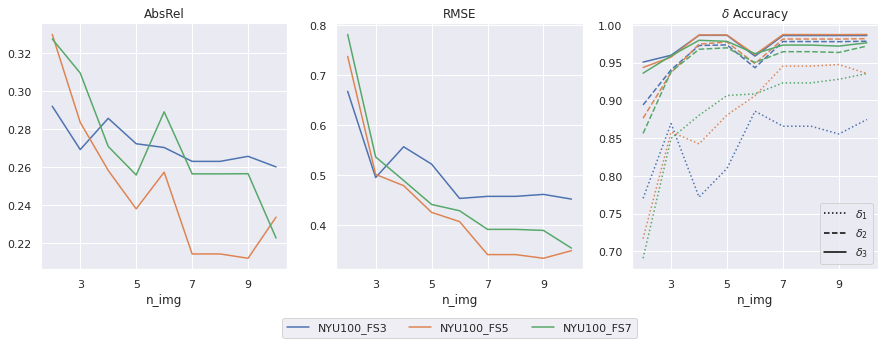

In [83]:
fig, axes = plt.subplots(1, 3, figsize=(15,15), sharey=False)

sns.lineplot(data=df_fs, x='n_img', y='AbsRel', hue='Setting', ax=axes[0], legend=False)
sns.lineplot(data=df_fs, x='n_img', y='RMSE', hue='Setting',  ax=axes[1])
sns.lineplot(data=df_fs, x='n_img', y='delta1', hue='Setting',  ax=axes[2], ls=':', legend=False)
sns.lineplot(data=df_fs, x='n_img', y='delta2', hue='Setting',  ax=axes[2], ls='--', legend=False)
sns.lineplot(data=df_fs, x='n_img', y='delta3', hue='Setting',  ax=axes[2], legend=False)

axes[0].set_box_aspect(1)
axes[1].set_box_aspect(1)
axes[2].set_box_aspect(1)
axes[0].set_ylabel('')
axes[0].set_xticks([3, 5, 7, 9])
axes[1].set_ylabel('')
axes[1].set_xticks([3, 5, 7, 9])
axes[2].set_ylabel('')
axes[2].set_xticks([3, 5, 7, 9])
axes[0].set_title('AbsRel')
axes[1].set_title('RMSE')
axes[2].set_title('$\delta$ Accuracy')
axes[1].legend(ncol=3, loc='lower center', bbox_to_anchor=(0.5, -0.3))

solid_line = mlines.Line2D([], [], color='black', label='$\delta_3$')
dash_line = mlines.Line2D([], [], color='black', ls='--', label='$\delta_2$')
dot_line = mlines.Line2D([], [], color='black', ls=':', label='$\delta_1$')

axes[2].legend(handles=[dot_line, dash_line, solid_line])

plt.show()
